In [ ]:
!wget https://datasets.simula.no/downloads/kvasir-seg.zip

In [ ]:
!unzip -qq /kaggle/working/kvasir-seg.zip

In [1]:
!pip install natsort

# Introduction

- The human gastrointestinal (GI) tract is made up of different sections, one of them being the large bowel. Several types of anomalies and diseases can affect the large bowel, such as colorectal cancer. Colorectal cancer is the second most common cancer type among women and third most common among men. Polyps are precursors to colorectal cancer, and is found in nearly half of the individuals at age 50 having a screening colonoscopy, and are increasing with age. Colonoscopy is the gold standard for detection and assessment of these polyps with subsequent biopsy and removal of the polyps. Early disease detection has a huge impact on survival from colorectal cancer, and polyp detection is therefore important. In addition, several studies have shown that polyps are often overlooked during colonoscopies, with polyp miss rates of 14%-30% depending on the type and size of the polyps. Increasing the detection of polyps has been shown to decrease risk of colorectal cancer. Thus, automatic detection of more polyps at an early stage can play a crucial role in improving both prevention of and survival from colorectal cancer.
- Polyps are lesions within the bowel detectable as mucosal outgrows. The polyps are either flat, elevated or pedunculated, and can be distinguished from normal mucosa by color and surface pattern. Most bowel polyps are harmless, but some have the potential to grow into cancer. Detection and removal of polyps are therefore important to prevent development of colorectal cancer. Since polyps may be overlooked by the doctors, automatic detection would most likely improve examination quality. Automatic computer aided detection of polyps would be valuable both for diagnosis, assessment and reporting.
- Since the number of images included in the dataset is small, up to 1000 images only, a methodology was used to generate more images using Gaussian blur more than once and each time it was used for a greater and greater degree of blur.
- The goal of using a Gaussian blur is to make the neural network also focus on the outline and try to locate the polyps despite the blur in the image.
- On the other hand, an improved neural structure was used for the U-NET model, so that the proposed structure helped to locate the polyps with higher accuracy.
- As we know, we are studying the ability to locate polyps that can develop into malignant cancer.

In [48]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from keras import layers, models
import pathlib
import natsort
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report
from sklearn.metrics import confusion_matrix

# Read Dataset Images

In [67]:
class readDataset:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
    def readPathes(self,):
      self.images = natsort.natsorted(list(pathlib.Path(os.path.join(self.dataset_path,
                                                          'images')).glob('*.*')))
      self.masks = natsort.natsorted(list(pathlib.Path(os.path.join(self.dataset_path,
                                                         'masks')).glob('*.*')))
    def readImages(self, data, typeData):
        images = []
        for img in data:
            if typeData == 'm':
              img = cv2.imread(str(img), 0)
            else:
              img = cv2.imread(str(img),)
              img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = img/255
            img = cv2.resize(img, (128, 128))
            if typeData == 'm':
                img = np.where(img > 0, 1, 0)
            images.append(img)
        return np.array(images)
    def dataAugmentation(self, images, masks):
        imagesupdate = []
        masksupdate = []
        for image, mask in zip(images, masks):
          for aug in range(4):
            imageup = image
            maskup = mask
            if aug == 0:
              imageup = image
              maskup = mask
            elif aug == 1:
              imageup = cv2.GaussianBlur(imageup,(3, 3),0)
            elif aug == 2:
              imageup = cv2.GaussianBlur(imageup,(5, 5),0)
            else:
              imageup = cv2.GaussianBlur(imageup,(11, 11),0)
            imagesupdate.append(imageup), masksupdate.append(maskup)
        return np.array(imagesupdate), np.array(masksupdate)

In [68]:
datasetObject = readDataset('/kaggle/working/Kvasir-SEG')
datasetObject.readPathes()

In [69]:
images = datasetObject.readImages(datasetObject.images, 'i')
masks = datasetObject.readImages(datasetObject.masks, 'm')
images.shape, masks.shape

((1000, 128, 128, 3), (1000, 128, 128))

In [25]:
images, masks = datasetObject.dataAugmentation(images, np.reshape(masks, (masks.shape[0], 128, 128, 1)))
images.shape, masks.shape

((4000, 128, 128, 3), (4000, 128, 128, 1))

In [26]:
np.min(images), np.max(images)

(0.0, 1.0000000000000002)

In [27]:
def show_sample(images, masks):
    plt.figure(figsize = (12, 12))
    for i in range(64):
        plt.subplot(8, 8, (i + 1))
        plt.imshow(images[i],)
        plt.imshow(masks[i], alpha = 0.3)
    plt.legend()

**Samples from dataset, images appear after applying several degrees of Gaussian blur to medical images, with the aim of making the neural network study many other features that help locate polyps.**

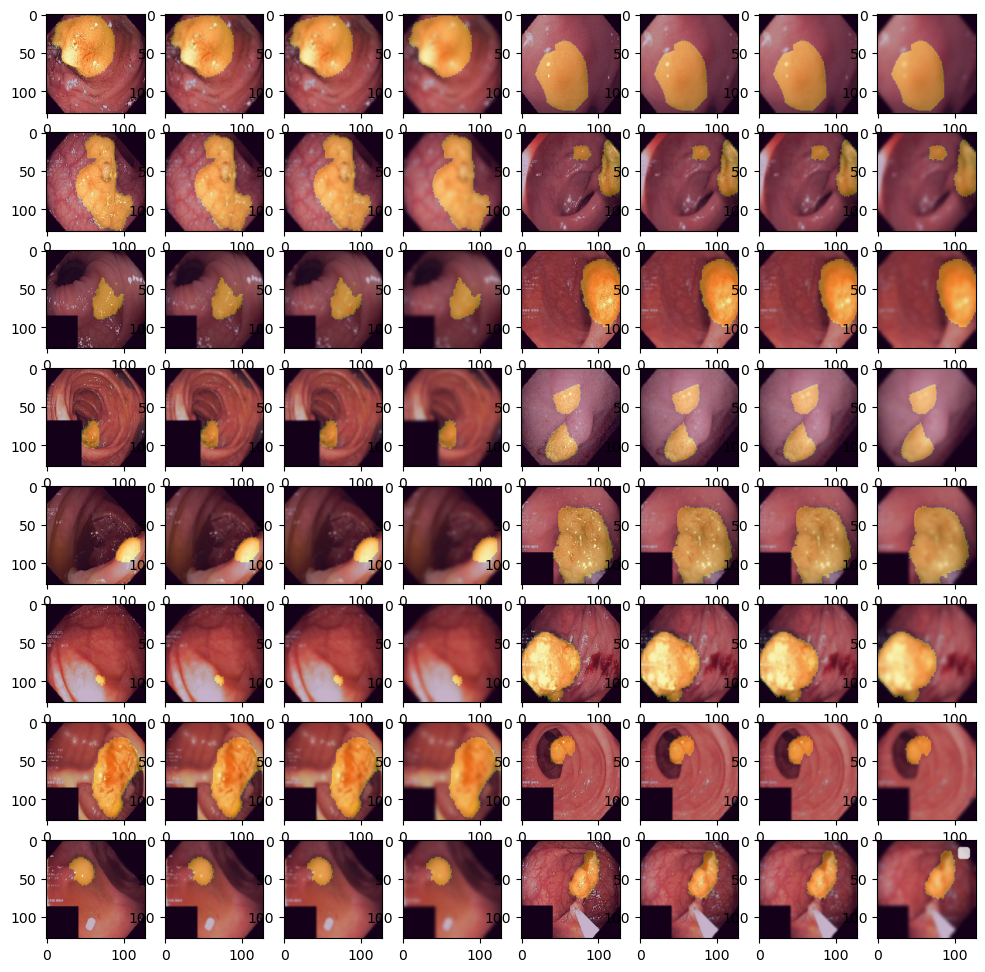

In [28]:
show_sample(images, masks)

In [29]:
trainIndexs = np.random.randint(0, len(images), size = (images.shape[0],))
images = images[trainIndexs]
masks = masks[trainIndexs]
trainSize = 3100
trainImages = images[:trainSize]
trainMasks = masks[:trainSize]
testImages = images[trainSize:]
testMasks = masks[trainSize:]
trainImages.shape, testImages.shape

((3100, 128, 128, 3), (900, 128, 128, 3))

# The proposed neural network architecture

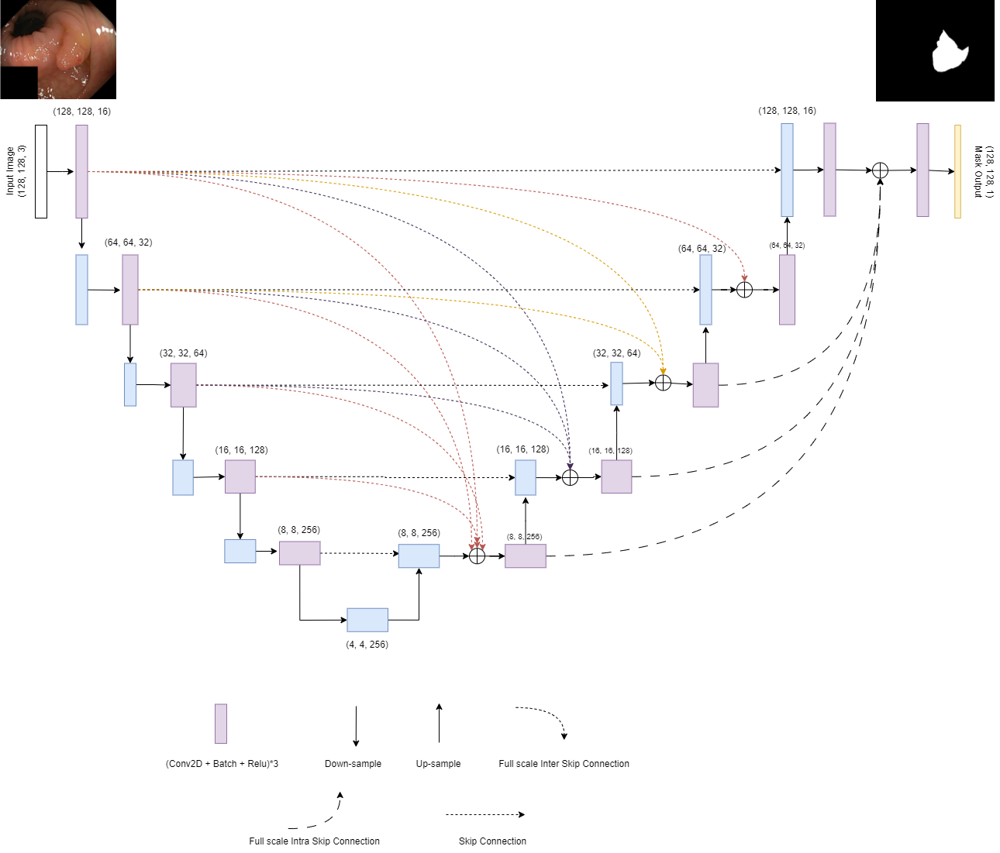

In [30]:
def convolution(input, filter, strides, padding, kernel_size, activation):
    x = input
    x = layers.Conv2D(filter, kernel_size = kernel_size, padding = padding,
                     strides = strides,)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv2D(filter, kernel_size = kernel_size, padding = padding,
                     strides = strides,)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv2D(filter, kernel_size = kernel_size, padding = padding,
                     strides = strides,)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    return x

In [31]:
def encoder(input, filter, strides, padding, kernel_size, activation):
    x = input
    x = convolution(x, filter, strides, padding, kernel_size, activation,)
    downsample = layers.MaxPooling2D()(x)
    return x, downsample

In [32]:
def decoder(input, skip, otherSkips, filter, strides, padding, kernel_size, activation):
    x = input
    x = layers.Conv2DTranspose(filter, kernel_size = kernel_size, padding = padding, 
                              strides = 2, )(x)
    x = layers.Activation(activation)(x)
    if otherSkips != None:
        z = None
        s = 2
        list_skips = []
        for skip_ in otherSkips:
            z = layers.Conv2D(filter, kernel_size = 1,strides = s, padding = 'same', 
                             activation = activation,)(skip_)
            list_skips.append(z)
            s = s*2
    if otherSkips != None:
     y = layers.add(list_skips)
    x = layers.add([x, skip])
    if otherSkips != None:
     x = layers.add([x, y])
    x = convolution(x, filter, strides, padding, kernel_size, activation)
    return x

In [33]:
input = layers.Input(shape = (128, 128, 3))
filter = 16
skip1, downsample1 = encoder(input, filter, strides = 1, padding = 'same', kernel_size = 5, activation = 'relu')
skip2, downsample2 = encoder(downsample1, filter*2, strides = 1, padding = 'same', kernel_size = 5, activation = 'relu')
skip3, downsample3 = encoder(downsample2, filter*4, strides = 1, padding = 'same', kernel_size = 5, activation = 'relu')
skip4, downsample4 = encoder(downsample3, filter*8, strides = 1, padding = 'same', kernel_size = 5, activation = 'relu')
skip5, downsample5 = encoder(downsample4, filter*16, strides = 1, padding = 'same', kernel_size = 5, activation = 'relu')
upsample1 = decoder(downsample5, skip5, [skip4, skip3, skip2, skip1], filter*16, 1,'same', 5, 'relu')
upsample2 = decoder(upsample1, skip4, [skip3, skip2, skip1], filter*8, 1,'same', 5, 'relu')
upsample3 = decoder(upsample2, skip3, [skip2, skip1], filter*4, 1,'same', 5, 'relu')
upsample4 = decoder(upsample3, skip2, [skip1], filter*2, 1,'same', 5, 'relu')
upsample5 = decoder(upsample4, skip1, None, filter, 1,'same',5, 'relu')
upsample5 = layers.add([
    upsample5, 
    layers.BatchNormalization()(layers.Conv2DTranspose(filter, kernel_size = 1, padding = 'same', strides = 4,)(upsample3)),
    layers.BatchNormalization()(layers.Conv2DTranspose(filter, kernel_size = 1, padding = 'same', strides = 8,)(upsample2)),
    layers.BatchNormalization()(layers.Conv2DTranspose(filter, kernel_size = 1, padding = 'same', strides = 16,)(upsample1))
])
upsample5 = convolution(upsample5, filter, 1, 'same', 5, 'relu',)
output = layers.Conv2D(1, kernel_size = 5, padding = 'same', strides = 1, 
                      activation = 'sigmoid')(upsample5)
generator = models.Model(inputs = input, outputs = output)
generator.compile(loss = tf.keras.losses.BinaryFocalCrossentropy(),
                  optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001),
                  metrics = ['accuracy', tf.keras.metrics.Precision(name = 'precision'),
                             tf.keras.metrics.Recall(name = 'recall')])
generator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_38 (Conv2D)             (None, 128, 128, 16  1216        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_36 (BatchN  (None, 128, 128, 16  64         ['conv2d_38[0][0]']              
 ormalization)                  )                                                           

In [34]:
history = generator.fit(trainImages, trainMasks, epochs = 120, batch_size = 8,
                        validation_data = (testImages, testMasks), callbacks = [
                            tf.keras.callbacks.EarlyStopping(patience = 9, monitor = 'val_loss',
                                                             mode = 'min',
                                                             restore_best_weights = True),
                            tf.keras.callbacks.ReduceLROnPlateau(patience = 7, monitor = 'val_loss', mode = 'min',
                                                                 factor = 0.1, min_lr = 0.0001)
                        ])

Epoch 1/120
388/388 [==============================] - 62s 83ms/step - loss: 0.0878 - accuracy: 0.8522 - precision: 0.5893 - recall: 0.2853 - val_loss: 0.0813 - val_accuracy: 0.8701 - val_precision: 0.6842 - val_recall: 0.3521 - lr: 0.0010
Epoch 2/120
388/388 [==============================] - 29s 75ms/step - loss: 0.0721 - accuracy: 0.8879 - precision: 0.7235 - recall: 0.4972 - val_loss: 0.0865 - val_accuracy: 0.8482 - val_precision: 0.5168 - val_recall: 0.8132 - lr: 0.0010
Epoch 3/120
388/388 [==============================] - 29s 75ms/step - loss: 0.0622 - accuracy: 0.9070 - precision: 0.7726 - recall: 0.6025 - val_loss: 0.0613 - val_accuracy: 0.9076 - val_precision: 0.7117 - val_recall: 0.7121 - lr: 0.0010
Epoch 4/120
388/388 [==============================] - 29s 75ms/step - loss: 0.0531 - accuracy: 0.9218 - precision: 0.8086 - recall: 0.6769 - val_loss: 0.0547 - val_accuracy: 0.9186 - val_precision: 0.8147 - val_recall: 0.6372 - lr: 0.0010
Epoch 5/120
388/388 [===================

# Performance Evaluation Measures:

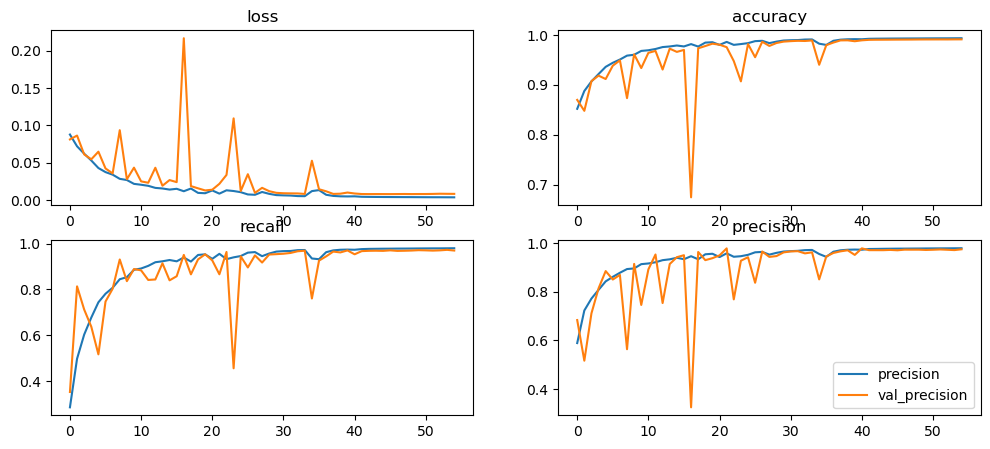

In [35]:
metrics = ['loss', 'accuracy', 'recall', 'precision']
plt.figure(figsize = (12, 5))
for i in range(4):
    plt.subplot(2, 2, (i + 1))
    plt.plot(history.history['{}'.format(metrics[i])], label = '{}'.format(metrics[i]))
    plt.plot(history.history['val_{}'.format(metrics[i])], label = 'val_{}'.format(metrics[i]))
    plt.title('{}'.format(metrics[i]))
plt.legend()

In [36]:
generator.evaluate(testImages, testMasks)

29/29 [==============================] - 2s 49ms/step - loss: 0.0082 - accuracy: 0.9907 - precision: 0.9715 - recall: 0.9702


[0.008209148421883583,
 0.9906697869300842,
 0.9715379476547241,
 0.9702211022377014]

In [44]:
generator.evaluate(trainImages, trainMasks)

97/97 [==============================] - 5s 56ms/step - loss: 0.0041 - accuracy: 0.9931 - precision: 0.9780 - recall: 0.9797


[0.004088852554559708,
 0.9931483268737793,
 0.9779658317565918,
 0.9797263741493225]

In [43]:
generator.save('/kaggle/working/unet.h5')

In [ ]:
# generator = tf.keras.models.load_model('generator.h5')

In [50]:
masks_pred = generator.predict(testImages)
masks_pred = (masks_pred >= 0.5).astype('int')

29/29 [==============================] - 1s 44ms/step


In [38]:
masks_pred.shape

(900, 128, 128, 1)

In [51]:
masks_pred = layers.Flatten()(masks_pred)
masks_pred  = np.reshape(masks_pred, -1)
masks_actual = layers.Flatten()(testMasks)
masks_actual  = np.reshape(masks_actual, -1)
masks_pred.shape, masks_actual.shape

((14745600,), (14745600,))

In [52]:
print(classification_report(masks_actual, masks_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99  12381777
           1       0.97      0.97      0.97   2363823

    accuracy                           0.99  14745600
   macro avg       0.98      0.98      0.98  14745600
weighted avg       0.99      0.99      0.99  14745600



In [54]:
tn, fp, fn, tp = confusion_matrix(masks_actual, masks_pred).ravel()

In [56]:
metrics = pd.DataFrame([
    accuracy_score(masks_actual, masks_pred)*100,
    precision_score(masks_actual, masks_pred)*100,
    recall_score(masks_actual, masks_pred)*100,
    ((2*tp)/(2*tp + fp + fn))*100
], index = ['accuracy score', 'precision score', 'recall score', 'dice score'],
   columns = ['Metrics For Validation Data'])
metrics.head()

,Metrics For Validation Data
accuracy score,99.066935
precision score,97.153710
recall score,97.021943
dice score,97.087782


In [63]:
def segmentation(data, m):
    masks_pred = m.predict(data)
    masks_pred = np.array(masks_pred)
    masks_pred = (masks_pred >= 0.5).astype('int32')
    return masks_pred

In [64]:
masks_pred = segmentation(testImages, generator)
masks_pred.shape

29/29 [==============================] - 1s 45ms/step


(900, 128, 128, 1)

In [65]:
def draw(images, masks, y_pred):
  plt.figure(figsize = (12, 50))
  index = -1
  n = np.random.randint(y_pred.shape[0])
  for i in range(120):
    plt.subplot(20, 6, (i + 1))
    if index == -1:
      plt.imshow(images[n],)
      plt.title('Image')
      index = 0
    elif index == 0:
      plt.imshow(images[n],)
      plt.imshow(masks[n], alpha = 0.5)
      plt.title('Original Mask')
      index = 1
    elif index == 1:
      plt.imshow(images[n],)
      plt.imshow(np.reshape(y_pred[n], (128, 128)), alpha = 0.5)
      plt.title('Predict Mask')
      index = -1
      n = np.random.randint(y_pred.shape[0])
  plt.legend()

# Visual samples of automatically locating polyps.

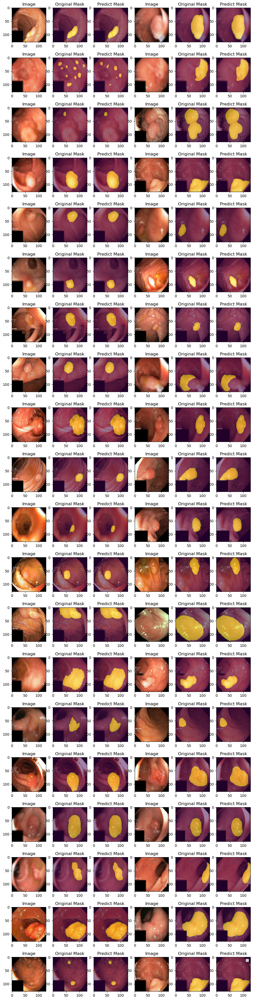

In [66]:
draw(testImages, testMasks, masks_pred)

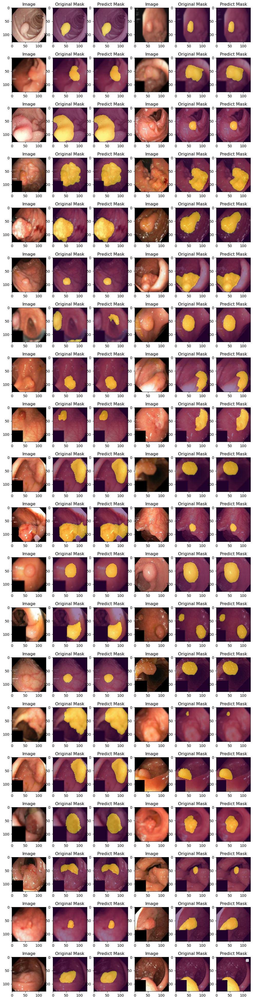

In [41]:
draw(testImages, testMasks, masks_pred)

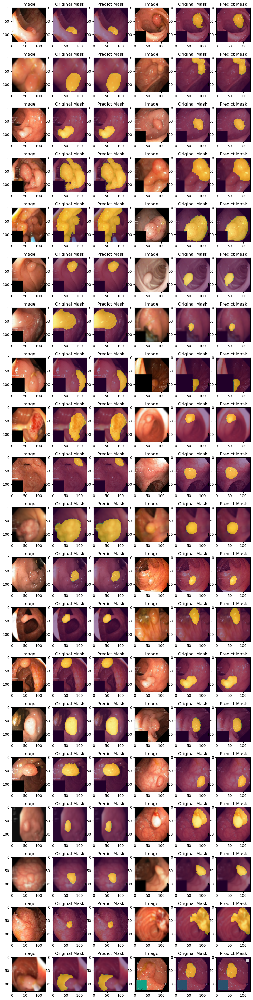

In [42]:
draw(testImages, testMasks, masks_pred)